# Importing Libraries

In [ ]:
!pip install datasets

In [ ]:
import os
import torch

import numpy as np
import matplotlib.pyplot as plt
from diffusers import LDMSuperResolutionPipeline
from mpl_toolkits.axes_grid1.inset_locator import mark_inset, zoomed_inset_axes

# Configuration

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model_id = "CompVis/ldm-super-resolution-4x-openimages"
num_samples = 20

# Dataset Loading

In [ ]:
from google.colab import files
import zipfile
import os

# Upload your image folder as a zip file
uploaded = files.upload()

# Extract zip file
for fn in uploaded.keys():
    if fn.endswith('.zip'):
        with zipfile.ZipFile(fn, 'r') as zip_ref:
            zip_ref.extractall("data")  # This will extract to 'data/' folder
        print(f"{fn} extracted to /data/")

Saving images_1000.zip to images_1000.zip
images_1000.zip extracted to /data/


In [ ]:
from datasets import Dataset, Features, Value, Image
import os

# Collect all image paths
image_folder = "data/images_1000"
image_files = [os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Prepare dicts for HuggingFace Dataset
image_dicts = [{"image": path} for path in image_files]

# Define feature schema (only 'image')
features = Features({"image": Image()})

# Create dataset
dataset = Dataset.from_list(image_dicts, features=features)

# Optional shuffle
dataset = dataset.shuffle(seed=42)

# Latent Diffusion Model PipeLine

In [ ]:

ldm_pipeline = LDMSuperResolutionPipeline.from_pretrained(
    model_id, torch_dtype=torch.float16
    # if using an Ampere-class GPU or above, use torch.bfloat16 for benefits
)
ldm_pipeline = ldm_pipeline.to("cuda")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/248 [00:00<?, ?B/s]

Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/455M [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/221M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/713 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/286 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/873 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--CompVis--ldm-super-resolution-4x-openimages/snapshots/0b55ddf931a8e3a1b426b3a50ddcf325ff84f668/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--CompVis--ldm-super-resolution-4x-openimages/snapshots/0b55ddf931a8e3a1b426b3a50ddcf325ff84f668/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--CompVis--ldm-super-resolution-4x-openimages/snapshots/0b55ddf931a8e3a1b426b3a50ddcf325ff84f668/vqvae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--CompVis--ldm-super-resolution-4x-openimages/snapshots/0b55ddf931a8e3a1b426b3a50ddcf325ff84f668/vqvae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


In [ ]:
def pipe(image):
    return ldm_pipeline(image, num_inference_steps=100, eta=1).images

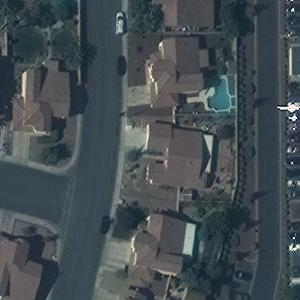

In [ ]:
dataset[0]["image"]

# Training

In [ ]:
res_originals = []
res_outputs = []
for idx in range(0, num_samples):
    item = dataset[idx]
    res_image = pipe(item["image"])
    res_originals.append(item["image"])
    res_outputs.append(res_image)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

In [ ]:
res_originals[0], res_outputs[0]

(<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=300x300>,
 [<PIL.Image.Image image mode=RGB size=1152x1152>])

# Output

In [ ]:
def plot_image_without_zoom(original_img, res_img):
    import numpy as np
    import matplotlib.pyplot as plt

    original_np_img = np.asarray(original_img)
    res_np_img = np.asarray(res_img).squeeze(0)

    original_np_img = original_np_img.astype("float32") / 255.0
    res_np_img = res_np_img.astype("float32") / 255.0

    fig, ax = plt.subplots(1, 2, figsize=(10, 5), dpi=200)
    ax[0].imshow(original_np_img)
    ax[0].set_title("Original Image")
    ax[0].axis("off")

    ax[1].imshow(res_np_img)
    ax[1].set_title("Superresolution Result")
    ax[1].axis("off")

    plt.tight_layout()
    plt.show()


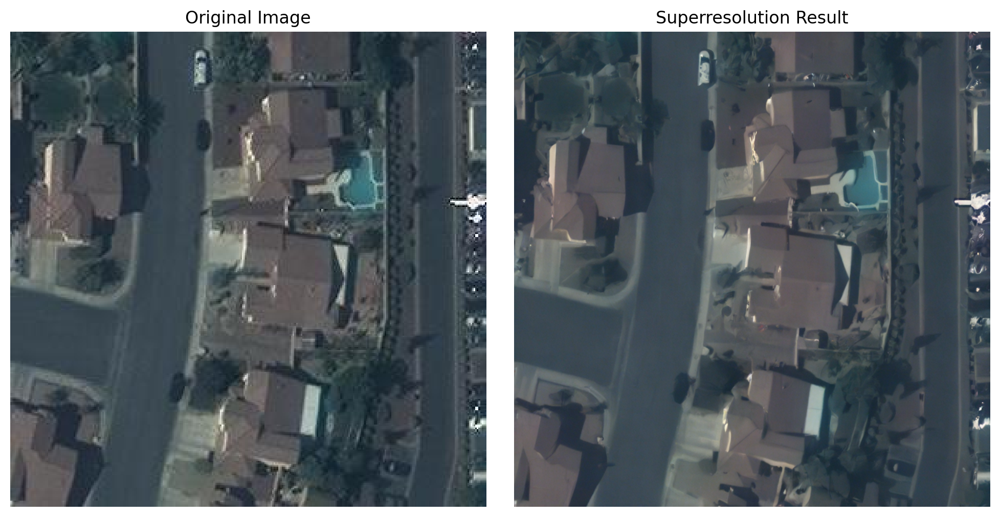

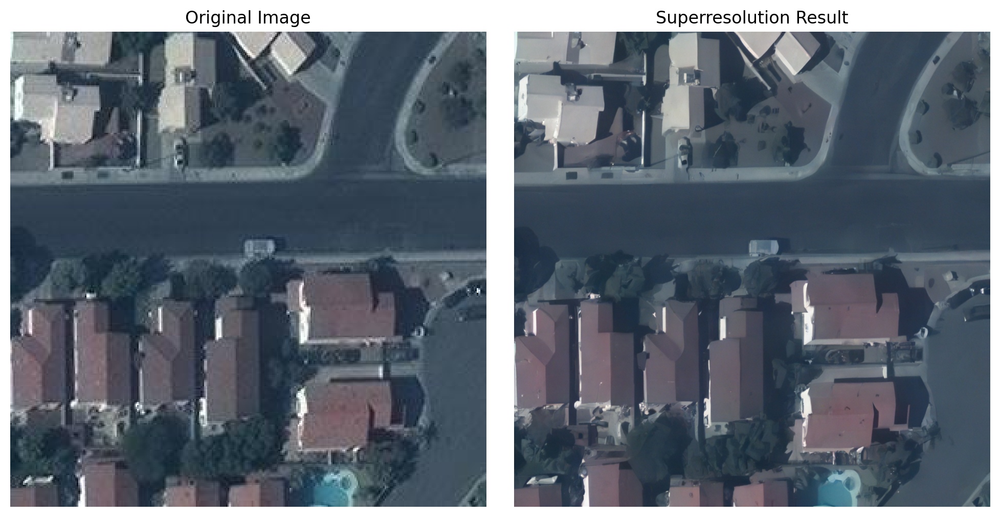

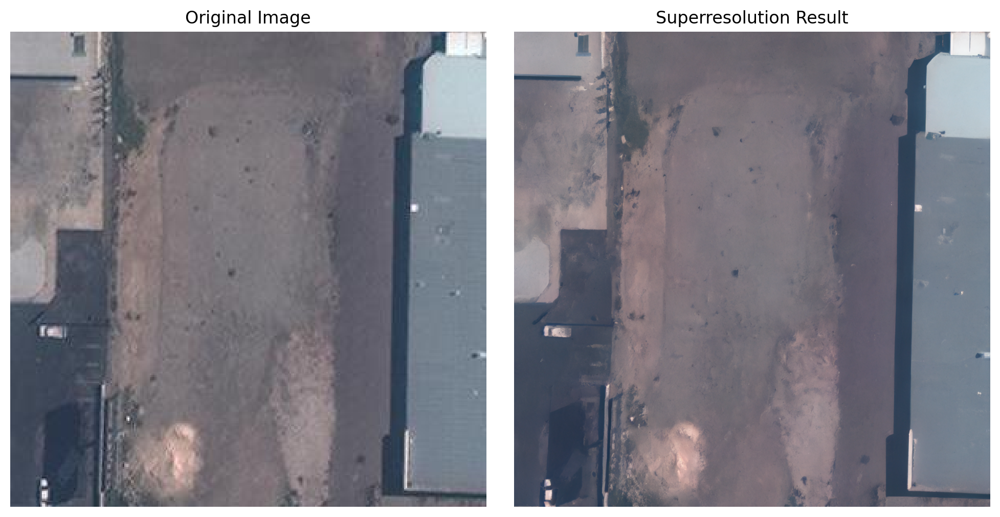

In [ ]:
for i in range(3):
  plot_image_without_zoom(res_originals[i], res_outputs[i])

In [ ]:
# Output the images with zoom
def plot_image_with_zoom(original_img, res_img):
    import numpy as np
    import matplotlib.pyplot as plt
    from mpl_toolkits.axes_grid1.inset_locator import mark_inset, zoomed_inset_axes

    original_np_img = np.asarray(original_img)
    res_np_img = np.asarray(res_img).squeeze(0)

    original_np_img = original_np_img.astype("float32") / 255.0
    res_np_img = res_np_img.astype("float32") / 255.0

    fig, ax = plt.subplots(1, 2, figsize=(10, 5), dpi=200)
    ax[0].imshow(original_np_img)
    ax[0].set_title("Original Image")

    ax[1].imshow(res_np_img)
    ax[1].set_title("Superresolution Result")

    # Repositioned zoom: lower right of both images
    original_axins = zoomed_inset_axes(ax[0], zoom=2, loc=2)
    original_axins.imshow(original_np_img[::-1], origin="lower")
    original_axins.set_xlim(100, 150)
    original_axins.set_ylim(100, 150)
    original_axins.set_xticks([])
    original_axins.set_yticks([])
    mark_inset(ax[0], original_axins, loc1=1, loc2=3, fc="none", ec="blue")

    res_axins = zoomed_inset_axes(ax[1], zoom=2, loc=2)
    res_axins.imshow(res_np_img[::-1], origin="lower")
    res_axins.set_xlim(450, 600)
    res_axins.set_ylim(450, 600)
    res_axins.set_xticks([])
    res_axins.set_yticks([])
    mark_inset(ax[1], res_axins, loc1=1, loc2=3, fc="none", ec="blue")

    plt.tight_layout()
    plt.show()

<ipython-input-37-3c353d65fe4f>:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


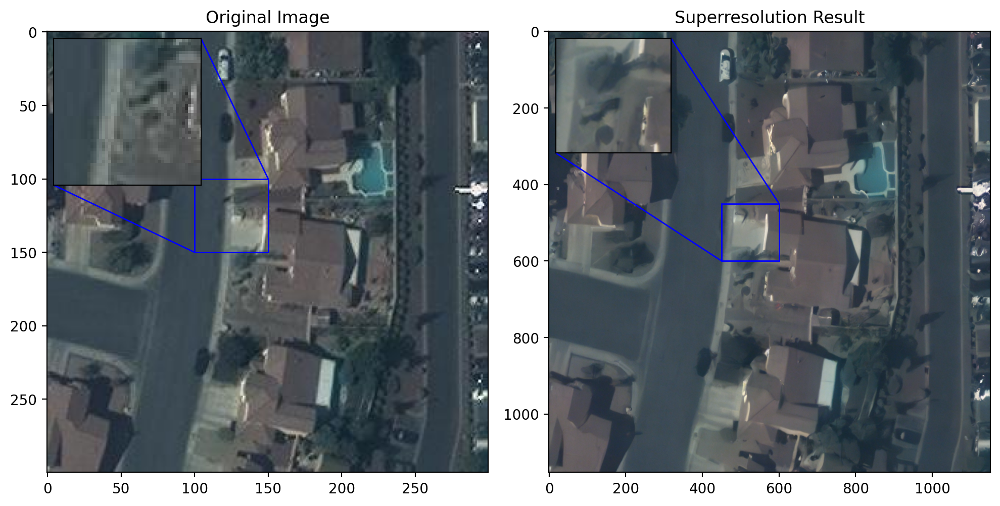

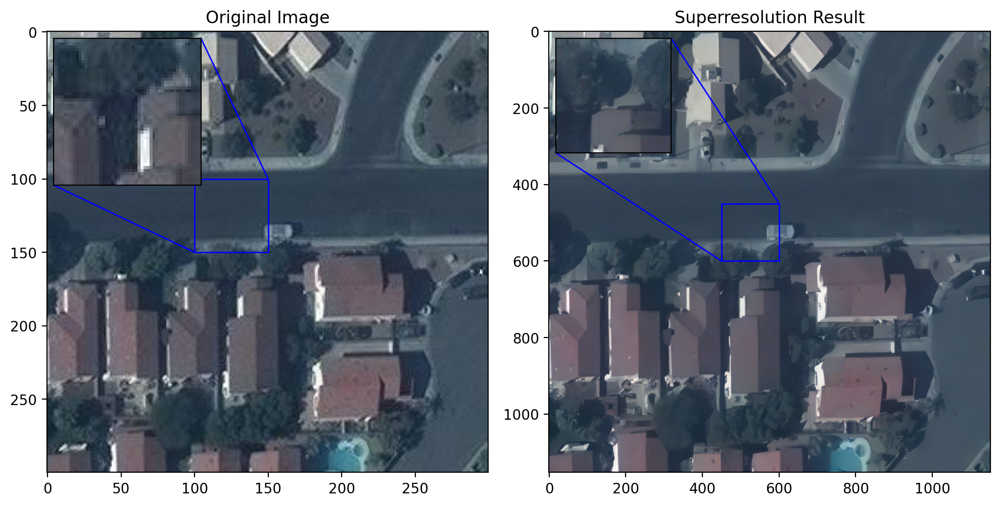

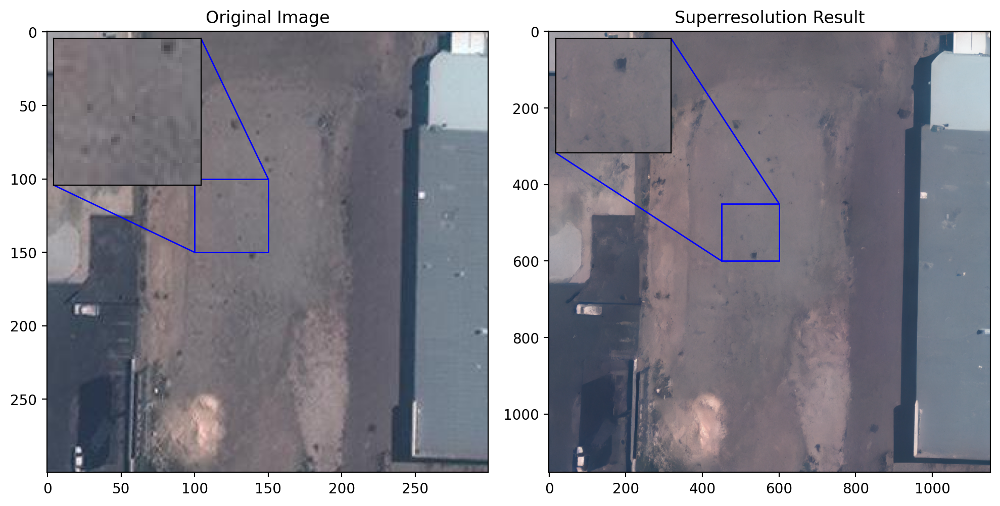

In [ ]:
for i in range(3):
  plot_image_with_zoom(res_originals[i], res_outputs[i])

# Custom Testing

In [ ]:

# Specify the full path to your single image
single_image_path = "/content/custom.jpg"

# Create a dataset with just that image
image_dicts = [{"image": single_image_path}]
features = Features({"image": Image()})
dataset = Dataset.from_list(image_dicts, features=features)

item = dataset[0]
res_image = pipe(item["image"])

  0%|          | 0/100 [00:00<?, ?it/s]